## Interpolating extracted properties (DEM TOP) to the structured model grid using griddata, making packages necessary to create a structured grid model

Import libraries

In [1]:
import flopy
import pathlib as pl
import glob

from flopy.utils import GridIntersect, Raster
from shapely.geometry import Polygon, Point
from scipy.interpolate import griddata

import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd
import geopandas as gpd
import shapely.geometry as geom
import rasterio as rio
import scipy.interpolate
import os
import flopy.utils.binaryfile as bf

Check version

In [2]:
flopy.__version__

'3.8.0'

Load packages

In [3]:
sim = flopy.mf6.MFSimulation.load(
    sim_name='mf6',
    exe_name = 'mf6.exe',
    sim_ws = './model_files_dem',
    strict=True,
    verbosity_level=1,
    load_only=['DISU'],
    verify_data=True,
    write_headers=True,
    lazy_io=False,
    use_pandas=True,
)

loading simulation...
  loading simulation name file...
  loading tdis package...
  loading model gwf6...
    loading package disu...
    skipping package ic...
    skipping package oc...
    skipping package npf...
    skipping package chd...
    skipping package ghb...
    skipping package riv...
    skipping package rch...
    skipping package evt...
    skipping package ims6...
Checking model "mf6model"...

mf6model MODEL DATA VALIDATION SUMMARY:
  No errors or warnings encountered.

Checking for missing simulation packages...
Error: no solution package


Obtain model object from a simulation object

In [4]:
m=sim.get_model()

Definig the projection system

In [5]:
prj1=('PROJCS["NAD_1927_StatePlane_Wyoming_West_Central_FIPS_4903",'
    'GEOGCS["GCS_North_American_1927",DATUM["D_North_American_1927",'
    'SPHEROID["Clarke_1866",6378206.4,294.9786982]],'
    'PRIMEM["Greenwich",0.0],'
    'UNIT["Degree",0.0174532925199433]],'
    'PROJECTION["Transverse_Mercator"],'
    'PARAMETER["False_Easting",500000.0],'
    'PARAMETER["False_Northing",0.0],'
    'PARAMETER["Central_Meridian",-108.75],'
    'PARAMETER["Scale_Factor",0.9999411764705882],'
    'PARAMETER["Latitude_Of_Origin",40.66666666666666],'
    'UNIT["Foot_US",0.3048006096012192]]'
                            )

Extracting regional model grid vertices and defining bound of the reg modelgrid to verify the location with buffer and wells

In [6]:
X_reg=m.modelgrid.get_xvertices_for_layer(0)
Y_reg=m.modelgrid.get_yvertices_for_layer(0)

In [7]:
x_min_reg=np.min(X_reg)
x_max_reg=np.max(X_reg)
y_min_reg=np.min(Y_reg)
y_max_reg=np.max(Y_reg)
bounds_reg = Polygon([(x_min_reg,y_min_reg),(x_min_reg,y_max_reg),(x_max_reg,y_max_reg),(x_max_reg,y_min_reg),(x_min_reg,y_min_reg)])
x_min_reg,y_min_reg,x_max_reg,y_max_reg
print(bounds_reg)

POLYGON ((582198.1 840855.958, 582198.1 856055.958, 605698.1 856055.958, 605698.1 840855.958, 582198.1 840855.958))


Defining well locations and creating a buffer

In [8]:
well_locations = [Point(593730.641, 846267.604),
                Point(593729.391, 846264.894),
                Point(593728.141, 846262.314),
                Point(593728.871, 846256.484),
                Point(593730.851, 846260.844),
                Point(593732.221, 846263.654),
                Point(593733.491, 846266.344),
                Point(593735.321, 846270.994),
                Point(593739.921, 846268.894),
                Point(593737.941, 846264.394),
                Point(593736.731, 846261.664),
                Point(593735.251, 846258.954),
                Point(593733.221, 846254.464)]

Creating a buffer around the well locations

In [9]:
center_point = well_locations[6] 
buffer_distance = 150 #ft, the distance from ssma experimental location to little wind river is ~215 ft 
                            #so the distance has to be less otherwise grid will fall on river 

center_x, center_y = center_point.x, center_point.y

x_min_bf = center_x - buffer_distance
x_max_bf = center_x + buffer_distance
y_min_bf = center_y - buffer_distance
y_max_bf = center_y + buffer_distance

width_bf = x_max_bf - x_min_bf
height_bf = y_max_bf - y_min_bf

width_bf, height_bf

(300.0, 300.0)

Buffer min and max

In [10]:
x_min_bf, x_max_bf, y_min_bf, y_max_bf

(593583.491, 593883.491, 846116.344, 846416.344)

Defining bounding box of the buffer

In [11]:
bounds_bf = Polygon([(x_min_bf,y_min_bf),(x_min_bf,y_max_bf),(x_max_bf,y_max_bf),(x_max_bf,y_min_bf),(x_min_bf,y_min_bf)])

In [12]:
print(bounds_bf)

POLYGON ((593583.491 846116.344, 593583.491 846416.344, 593883.491 846416.344, 593883.491 846116.344, 593583.491 846116.344))


Creating geodataframe for visualizating and location validation

In [13]:
geometries = [bounds_reg, bounds_bf] + well_locations
gdf = gpd.GeoDataFrame(data={'geometry': geometries}, crs=prj1)

In [14]:
gdf.explore()

Defining a structured model grid dimensions and properties

In [15]:
nlay, nrow, ncol = 1, 200, 200
shape2d, shape3d = (nrow, ncol), (nlay, nrow, ncol)
xlen_sg = width_bf
ylen_sg = height_bf
delr = np.full(ncol, xlen_sg / ncol, dtype=float)
delc = np.full(nrow, ylen_sg / nrow, dtype=float)
ttop = np.full(shape2d, 1.0, dtype=float)
tbotm = np.full(shape3d, 0.0, dtype=float)

In [16]:
delr, delc

(array([1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5,
        1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5

Creating the structured model grid

In [17]:
base_grid = flopy.discretization.StructuredGrid(
    delc=delc,
    delr=delr,
    top=ttop,
    botm=tbotm,
    lenuni="Feet",
    crs=prj1,
    xoff=x_min_bf, #adjusted for buffer zone
    yoff=y_min_bf, #adjusted for buffer zone
    angrot=0.0,
    nlay=1,
    nrow=nrow,
    ncol=ncol,
)

In [18]:
base_grid

xll:593583.491; yll:846116.344; rotation:0.0; crs:PROJCS["NAD_1927_StatePlane_Wyoming_West_Central_FIPS_4903",GEOGCS["GCS_North_American_1927",DATUM["D_North_American_1927",SPHEROID["Clarke_1866",6378206.4,294.9786982]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["False_Easting",500000.0],PARAMETER["False_Northing",0.0],PARAMETER["Central_Meridian",-108.75],PARAMETER["Scale_Factor",0.9999411764705882],PARAMETER["Latitude_Of_Origin",40.66666666666666],UNIT["Foot_US",0.3048006096012192]]; units:feet; lenuni:1

Getting and plotting base grid cell centers and vertices 

In [19]:
xc = base_grid.xcellcenters
yc = base_grid.ycellcenters
xv = base_grid.xvertices 
yv = base_grid.yvertices

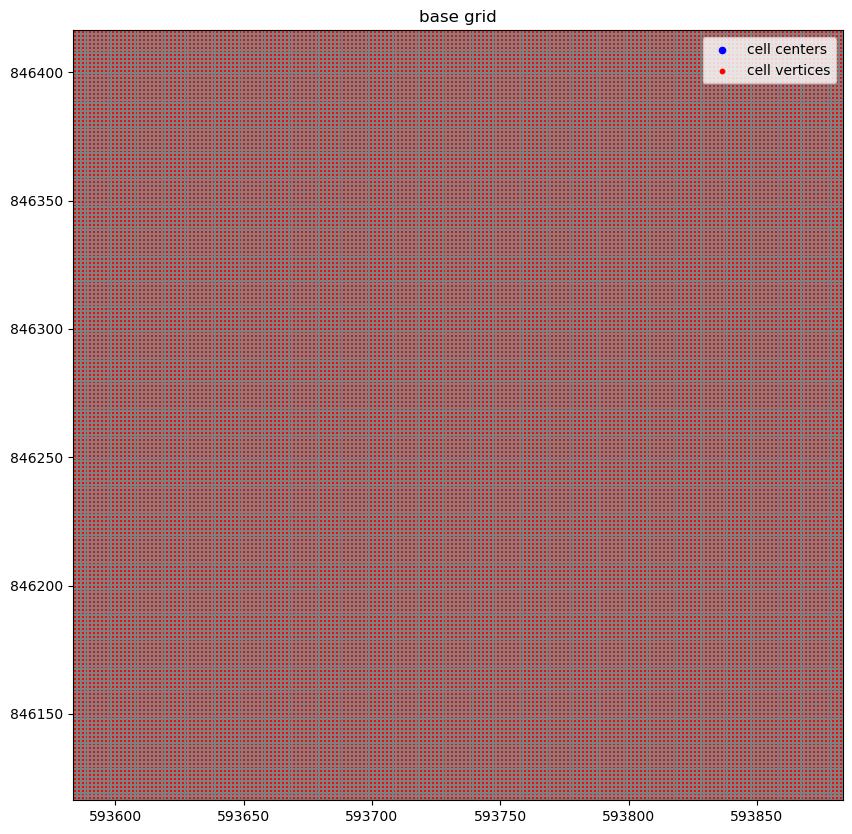

In [21]:
fig, ax = plt.subplots(figsize=(10,10))
base_grid.plot()
ax.scatter(xc.ravel(), yc.ravel(), c="b", label="cell centers", s=20)
ax.scatter(xv.ravel(), yv.ravel(), c="r", label="cell vertices", s=10)
plt.legend(loc=1);
plt.title('base grid')
plt.savefig('img-withDEM/base_grid', dpi=300)

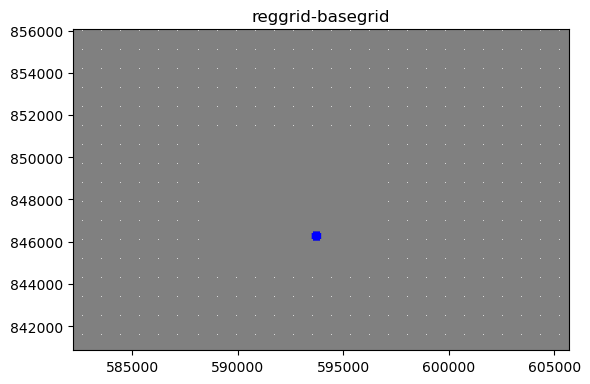

In [22]:
fig, ax = plt.subplots()

m.modelgrid.plot(ax=ax, color='gray')
base_grid.plot(ax=ax, color='blue')

plt.title('reggrid-basegrid')
plt.savefig('img-withDEM/mg_basegrid.png', dpi=300)

plt.show()

Creating geodataframe for visualizing and validating

In [24]:
cell_polygons = []

for i in range(base_grid.ncol):
    for j in range(base_grid.nrow):
        corners = [
            (xv[j, i], yv[j, i]),      
            (xv[j+1, i], yv[j+1, i]),  
            (xv[j+1, i+1], yv[j+1, i+1]),  
            (xv[j, i+1], yv[j, i+1])
        ]
        cell_polygon = Polygon(corners)
        cell_polygons.append(cell_polygon)

In [25]:
geometries1 = cell_polygons + well_locations
gdf1 = gpd.GeoDataFrame(data={'geometry': geometries1}, crs=prj1)

In [26]:
gdf1.explore()

Interpolation using griddata #need logic behind a certain interpolation method

Static properties Top

In [27]:
reg_data_top = pd.read_csv("stat_prp_eleK_mf6-combTop.csv")
x_reg = reg_data_top['x'].values
y_reg = reg_data_top['y'].values
z_reg_top = reg_data_top['top-DEM'].values

In [28]:
z_str_top = griddata((x_reg, y_reg), z_reg_top, (xc, yc), method='linear')

In [29]:
z_str_top = z_str_top.reshape((nrow, ncol))

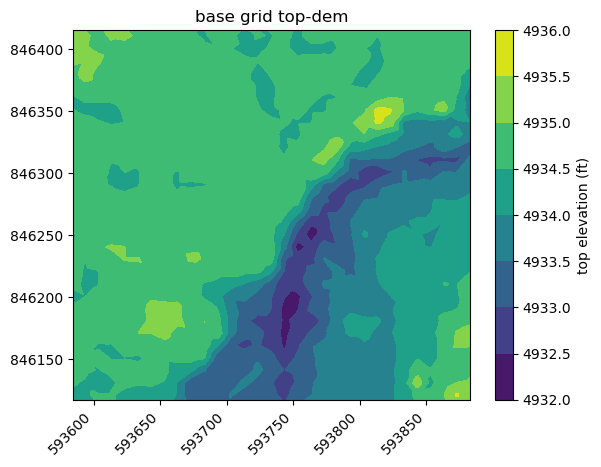

In [31]:
#z_str_top_masked = ma.masked_where(z_str_top < 4000, z_str_top)

plt.contourf(xc, yc, z_str_top)
plt.xticks(rotation=45, ha='right')
plt.title('base grid top-dem')
plt.colorbar(label='top elevation (ft)')
plt.savefig('img-withDEM/str_top-dem', dpi=300)
plt.show()

In [33]:
np.savetxt('interpolated_properties-withDEM/DEM_top_elev_int.txt', z_str_top, delimiter = ' ')